In [58]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.dates as mdates
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from matplotlib.colors import LinearSegmentedColormap


os.chdir(r"C:\Users\omaru\Desktop\DSM050 CWK 2 Data")
os.getcwd()

# -----------------------------
# Import HPI Data
# -----------------------------

df = pd.read_csv(r"C:\Users\omaru\Desktop\DSM050 CWK 2 Data\UK-HPI-full-file-2025-10.csv")
df_hpi=df

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


# -----------------------------
# Import Earnings Data
# -----------------------------

df_earn = pd.read_excel(r"C:\Users\omaru\Desktop\DSM050 CWK 2 Data\EARN05 Data.xlsx")
df_earn


,Unnamed: 0,United Kingdom,Great Britain,England,North East,North West,Yorkshire and The Humber,East Midlands,West Midlands,East of England,London,South East,South West,Wales,Scotland,Northern Ireland
0,Jan-Mar 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
1,Apr-Jun 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
2,Jul-Sep 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
3,Oct-Dec 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
4,Jan-Mar 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
5,Apr-Jun 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
6,Jul-Sep 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
7,Oct-Dec 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
8,Jan-Mar 1997,329,330,335,307,301,296,305,307,348,390,369,331,295,307,264
9,Apr-Jun 1997,338,339,345,312,313,307,313,313,355,410,391,317,291,304,283


In [59]:
df.shape

(148275, 54)

In [60]:
region_counts = df['RegionName'].value_counts().reset_index()
region_counts.columns = ['RegionName', 'RowCount']
region_counts


,RegionName,RowCount
0,Yorkshire and The Humber,691
1,West Midlands Region,691
2,Wales,691
3,East Midlands,691
4,Scotland,691
5,South West,691
6,United Kingdom,691
7,London,691
8,Northern Ireland,691
9,England,691


In [61]:
full_regions = [
    "North East",
    "North West",
    "Yorkshire and The Humber",
    "East Midlands",
    "West Midlands Region",
    "East of England",
    "London",
    "South East",
    "South West",
]

df_full = df[df['RegionName'].isin(full_regions)]
df_full.shape


(5034, 54)

In [62]:
df_full

,Date,RegionName,AreaCode,AveragePrice,Index,IndexSA,1m%Change,12m%Change,AveragePriceSA,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,Detached12m%Change,SemiDetachedPrice,SemiDetachedIndex,SemiDetached1m%Change,SemiDetached12m%Change,TerracedPrice,TerracedIndex,Terraced1m%Change,Terraced12m%Change,FlatPrice,FlatIndex,Flat1m%Change,Flat12m%Change,CashPrice,CashIndex,Cash1m%Change,Cash12m%Change,CashSalesVolume,MortgagePrice,MortgageIndex,Mortgage1m%Change,Mortgage12m%Change,MortgageSalesVolume,FTBPrice,FTBIndex,FTB1m%Change,FTB12m%Change,FOOPrice,FOOIndex,FOO1m%Change,FOO12m%Change,NewPrice,NewIndex,New1m%Change,New12m%Change,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume
39794,01/04/1968,East Midlands,E12000004,2914,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39795,01/05/1968,East Midlands,E12000004,2914,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39796,01/06/1968,East Midlands,E12000004,2914,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39797,01/07/1968,East Midlands,E12000004,3057,1.3,NaN,4.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39798,01/08/1968,East Midlands,E12000004,3057,1.3,NaN,4.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39799,01/09/1968,East Midlands,E12000004,3057,1.3,NaN,4.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39800,01/10/1968,East Midlands,E12000004,2961,1.3,NaN,-3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39801,01/11/1968,East Midlands,E12000004,2961,1.3,NaN,-3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39802,01/12/1968,East Midlands,E12000004,2961,1.3,NaN,-3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39803,01/01/1969,East Midlands,E12000004,2995,1.3,NaN,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
df_full.isnull().sum()


Date                         0
RegionName                   0
AreaCode                     0
AveragePrice                 0
Index                        0
IndexSA                   1704
1m%Change                   25
12m%Change                 108
AveragePriceSA            1704
SalesVolume               1722
DetachedPrice             1704
DetachedIndex             1704
Detached1m%Change         1713
Detached12m%Change        1812
SemiDetachedPrice         1704
SemiDetachedIndex         1704
SemiDetached1m%Change     1713
SemiDetached12m%Change    1812
TerracedPrice             1704
TerracedIndex             1704
Terraced1m%Change         1713
Terraced12m%Change        1812
FlatPrice                 1704
FlatIndex                 1704
Flat1m%Change             1713
Flat12m%Change            1812
CashPrice                 3540
CashIndex                 3540
Cash1m%Change             3549
Cash12m%Change            3648
CashSalesVolume           3558
MortgagePrice             3540
Mortgage

In [64]:
df_full.describe()


,AveragePrice,Index,IndexSA,1m%Change,12m%Change,AveragePriceSA,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,Detached12m%Change,SemiDetachedPrice,SemiDetachedIndex,SemiDetached1m%Change,SemiDetached12m%Change,TerracedPrice,TerracedIndex,Terraced1m%Change,Terraced12m%Change,FlatPrice,FlatIndex,Flat1m%Change,Flat12m%Change,CashPrice,CashIndex,Cash1m%Change,Cash12m%Change,CashSalesVolume,MortgagePrice,MortgageIndex,Mortgage1m%Change,Mortgage12m%Change,MortgageSalesVolume,FTBPrice,FTBIndex,FTB1m%Change,FTB12m%Change,FOOPrice,FOOIndex,FOO1m%Change,FOO12m%Change,NewPrice,NewIndex,New1m%Change,New12m%Change,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume
count,5034.000000,5034.000000,3330.000000,5009.000000,4926.000000,3330.000000,3312.000000,3.330000e+03,3330.000000,3321.000000,3222.000000,3330.000000,3330.000000,3321.000000,3222.000000,3330.000000,3330.000000,3321.000000,3222.000000,3330.000000,3330.000000,3321.000000,3222.000000,1494.000000,1494.000000,1485.000000,1386.000000,1476.000000,1494.000000,1494.000000,1485.000000,1386.000000,1476.000000,1494.000000,1494.000000,1485.000000,1386.000000,1494.000000,1494.000000,1485.000000,1386.000000,3312.000000,3312.000000,3303.000000,3204.000000,3312.000000,3312.000000,3312.000000,3303.000000,3204.000000,3312.000000
mean,123563.975963,42.877791,59.981772,1.179038,7.756780,172918.756156,8313.774758,3.025354e+05,59.847327,0.456278,5.930571,182171.446246,58.850781,0.482355,6.192955,148877.098498,59.060511,0.494249,6.363625,120223.856757,65.167027,0.432069,5.631223,242776.271084,82.073025,0.329293,4.058730,2219.313686,238666.046185,81.575636,0.351111,4.336797,5072.968835,201272.226238,81.984940,0.350101,4.265368,290224.860107,81.469411,0.340943,4.237229,210110.343297,59.939795,0.513079,6.321692,864.500604,170203.179952,59.580978,0.475507,6.144257,7449.274155
std,112958.798941,32.169144,25.622452,2.895051,10.282002,108503.845939,3753.527095,2.063214e+05,24.903883,1.430493,7.201433,127088.072939,25.598528,1.373399,7.701224,113631.525488,26.346043,1.621759,8.171120,84833.960241,25.709544,1.795498,8.495450,127720.647651,13.886466,1.519664,4.121892,1007.061909,111916.321109,14.445483,1.376544,4.049775,2247.835285,97080.082969,14.349105,1.481056,4.152116,143061.685114,14.179502,1.369353,4.013108,107697.766402,25.759452,1.865128,7.503261,423.027582,107880.433765,25.549042,1.442074,7.892844,3436.961746
min,2553.000000,0.800000,13.900000,-11.100000,-17.800000,39008.000000,1003.000000,6.639700e+04,14.500000,-7.800000,-18.100000,39833.000000,13.700000,-7.600000,-18.300000,29676.000000,12.700000,-10.300000,-18.600000,27003.000000,13.600000,-10.700000,-17.900000,100011.000000,55.400000,-9.400000,-5.500000,303.000000,108735.000000,54.100000,-8.000000,-5.200000,663.000000,92702.000000,55.100000,-9.200000,-5.500000,126203.000000,53.600000,-8.400000,-5.200000,51015.000000,13.300000,-7.800000,-18.400000,3.000000,37183.000000,13.600000,-8.900000,-17.800000,915.000000
25%,41204.250000,14.200000,38.000000,-0.300000,1.800000,108185.750000,5666.500000,1.905918e+05,39.425000,-0.400000,1.700000,110603.750000,36.900000,-0.300000,1.800000,85974.000000,35.000000,-0.300000,1.800000,76865.500000,43.700000,-0.500000,0.200000,147529.500000,71.525000,-0.300000,1.200000,1543.750000,152371.250000,70.400000,-0.300000,1.500000,3659.500000,129848.750000,70.825000,-0.300000,1.400000,181223.000000,70.700000,-0.300000,1.500000,136885.000000,38.575000,-0.600000,2.000000,543.000000,105318.500000,37.375000,-0.300000,1.500000,5081.500000
50%,105748.500000,36.250000,60.600000,0.700000,5.800000,147127.500000,7791.500000,2.502435e+05,60.600000,0.400000,5.200000,147591.000000,59.100000,0.500000,5.100000,116223.500000,60.100000,0.500000,5.100000,100441.000000,68.300000,0.500000,4.500000,199819.000000,81.050000,0.400000,3.700000,2104.000000,203943.000000,80.700000,0.400000,3.900000,4955.000000,173153.000000,81.200000,0.400000,3.800000,243100.500000,80.600000,0.400000,3.900000,198992.500000,60.100000,0.5

In [65]:
missing_by_region = (
    df_full.groupby("RegionName")
           .apply(lambda x: x.isnull().sum())
)

missing_by_region


C:\Users\omaru\AppData\Local\Temp\ipykernel_53908\2575059251.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.isnull().sum())


,Date,RegionName,AreaCode,AveragePrice,Index,IndexSA,1m%Change,12m%Change,AveragePriceSA,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,Detached12m%Change,SemiDetachedPrice,SemiDetachedIndex,SemiDetached1m%Change,SemiDetached12m%Change,TerracedPrice,TerracedIndex,Terraced1m%Change,Terraced12m%Change,FlatPrice,FlatIndex,Flat1m%Change,Flat12m%Change,CashPrice,CashIndex,Cash1m%Change,Cash12m%Change,CashSalesVolume,MortgagePrice,MortgageIndex,Mortgage1m%Change,Mortgage12m%Change,MortgageSalesVolume,FTBPrice,FTBIndex,FTB1m%Change,FTB12m%Change,FOOPrice,FOOIndex,FOO1m%Change,FOO12m%Change,NewPrice,NewIndex,New1m%Change,New12m%Change,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume
RegionName,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
East Midlands,0,0,0,0,0,321,3,12,321,323,321,321,322,333,321,321,322,333,321,321,322,333,321,321,322,333,525,525,526,537,527,525,525,526,537,527,525,525,526,537,525,525,526,537,323,323,324,335,323,323,323,324,335,323
East of England,0,0,0,0,0,33,3,12,33,35,33,33,34,45,33,33,34,45,33,33,34,45,33,33,34,45,237,237,238,249,239,237,237,238,249,239,237,237,238,249,237,237,238,249,35,35,36,47,35,35,35,36,47,35
London,0,0,0,0,0,321,3,12,321,323,321,321,322,333,321,321,322,333,321,321,322,333,321,321,322,333,525,525,526,537,527,525,525,526,537,527,525,525,526,537,525,525,526,537,323,323,324,335,323,323,323,324,335,323
North East,0,0,0,0,0,33,3,12,33,35,33,33,34,45,33,33,34,45,33,33,34,45,33,33,34,45,237,237,238,249,239,237,237,238,249,239,237,237,238,249,237,237,238,249,35,35,36,47,35,35,35,36,47,35
North West,0,0,0,0,0,0,1,12,0,2,0,0,1,12,0,0,1,12,0,0,1,12,0,0,1,12,204,204,205,216,206,204,204,205,216,206,204,204,205,216,204,204,205,216,2,2,3,14,2,2,2,3,14,2
South East,0,0,0,0,0,33,3,12,33,35,33,33,34,45,33,33,34,45,33,33,34,45,33,33,34,45,237,237,238,249,239,237,237,238,249,239,237,237,238,249,237,237,238,249,35,35,36,47,35,35,35,36,47,35
South West,0,0,0,0,0,321,3,12,321,323,321,321,322,333,321,321,322,333,321,321,322,333,321,321,322,333,525,525,526,537,527,525,525,526,537,527,525,525,526,537,525,525,526,537,323,323,324,335,323,323,323,324,335,323
West Midlands Region,0,0,0,0,0,321,3,12,321,323,321,321,322,333,321,321,322,333,321,321,322,333,321,321,322,333,525,525,526,537,527,525,525,526,537,527,525,525,526,537,525,525,526,537,323,323,324,335,323,323,323,324,335,323
Yorkshire and The Humber,0,0,0,0,0,321,3,12,321,323,321,321,322,333,321,321,322,333,321,321,322,333,321,321,322,333,525,525,526,537,527,525,525,526,537,527,525,525,526,537,525,525,526,537,323,323,324,335,323,323,323,324,335,323


Summary Statistics for Average Price (1995 onwards):
count      3330.000000
mean     173253.240240
std      108462.657685
min       38528.000000
25%      108246.250000
50%      147077.000000
75%      218528.000000
max      581320.000000
Name: AveragePrice, dtype: float64


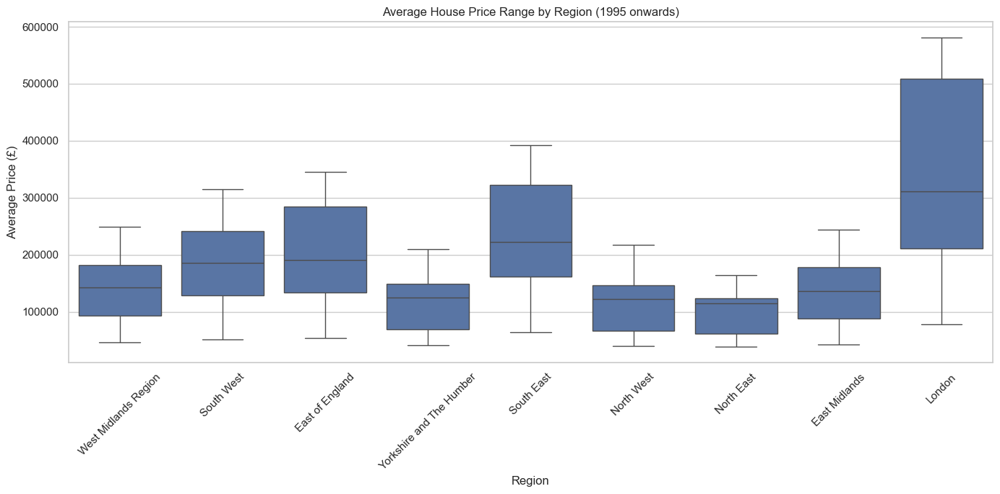

In [83]:
# RQ1 — How do average house prices differ across English regions

sns.set(style="whitegrid")

# --- Filter dataset to 1995 onwards ---
df_1995 = df_full[df_full['Date'] >= '01/01/1995'].copy()

# --- Summary statistics for filtered dataset ---
summary_stats_1995 = df_1995['AveragePrice'].describe()
print("Summary Statistics for Average Price (1995 onwards):")
print(summary_stats_1995)

# --- Boxplot by Region ---
plt.figure(figsize=(14, 7))
sns.boxplot(data=df_1995, x='RegionName', y='AveragePrice')
plt.title("Average House Price Range by Region (1995 onwards)")
plt.xlabel("Region")
plt.ylabel("Average Price (£)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



C:\Users\omaru\AppData\Local\Temp\ipykernel_53908\1686539759.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_full['Date'] = pd.to_datetime(df_full['Date'], dayfirst=True)


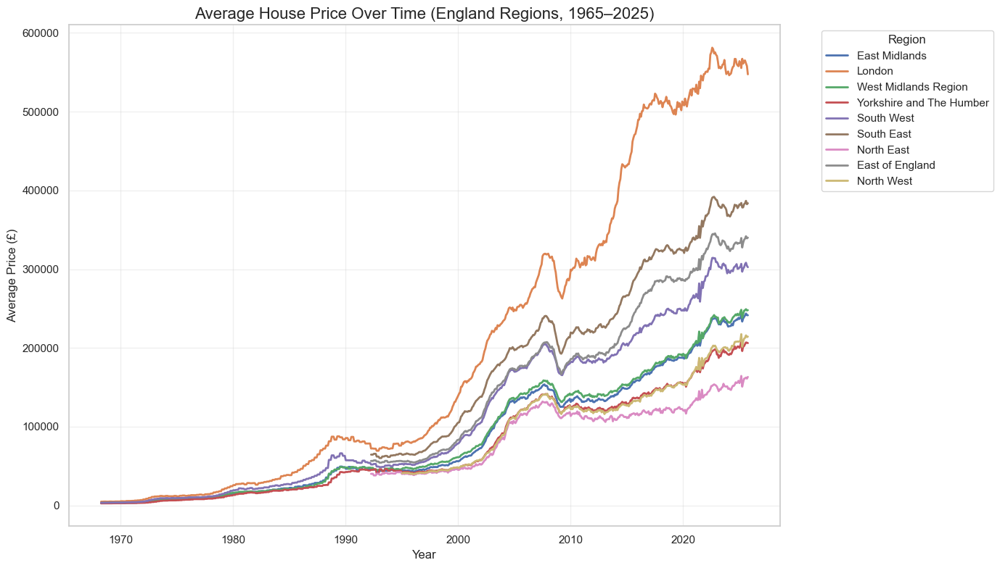

In [67]:

# Ensure Date is datetime and sorted
df_full['Date'] = pd.to_datetime(df_full['Date'], dayfirst=True)
df_full = df_full.sort_values('Date')

plt.figure(figsize=(14, 8))

sns.lineplot(
    data=df_full,
    x='Date',
    y='AveragePrice',
    hue='RegionName',
    linewidth=2
)

plt.title("Average House Price Over Time (England Regions, 1965–2025)", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Average Price (£)")
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


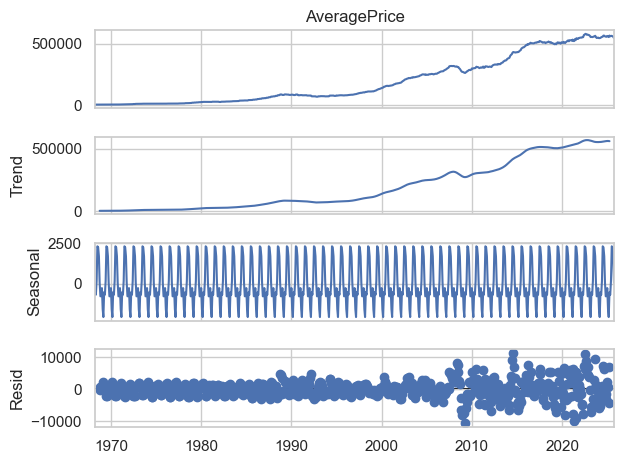

In [68]:


region = "London"
series = df_full[df_full['RegionName'] == region].set_index('Date')['AveragePrice']

decomp = seasonal_decompose(series, model='additive', period=12)
fig = decomp.plot()


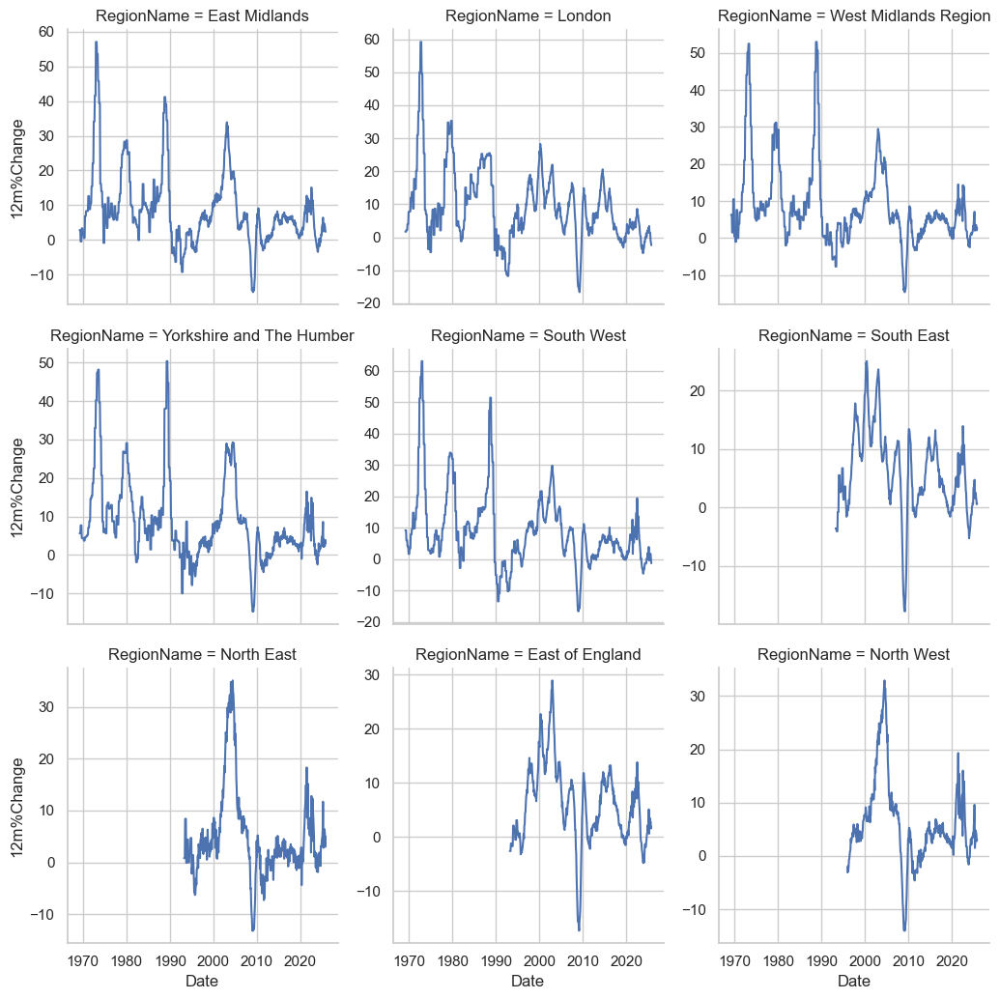

In [69]:
sns.relplot(
    data=df_full,
    x="Date",
    y="12m%Change",
    col="RegionName",
    kind="line",
    col_wrap=3,
    height=3.5,
    facet_kws={'sharey': False}
)


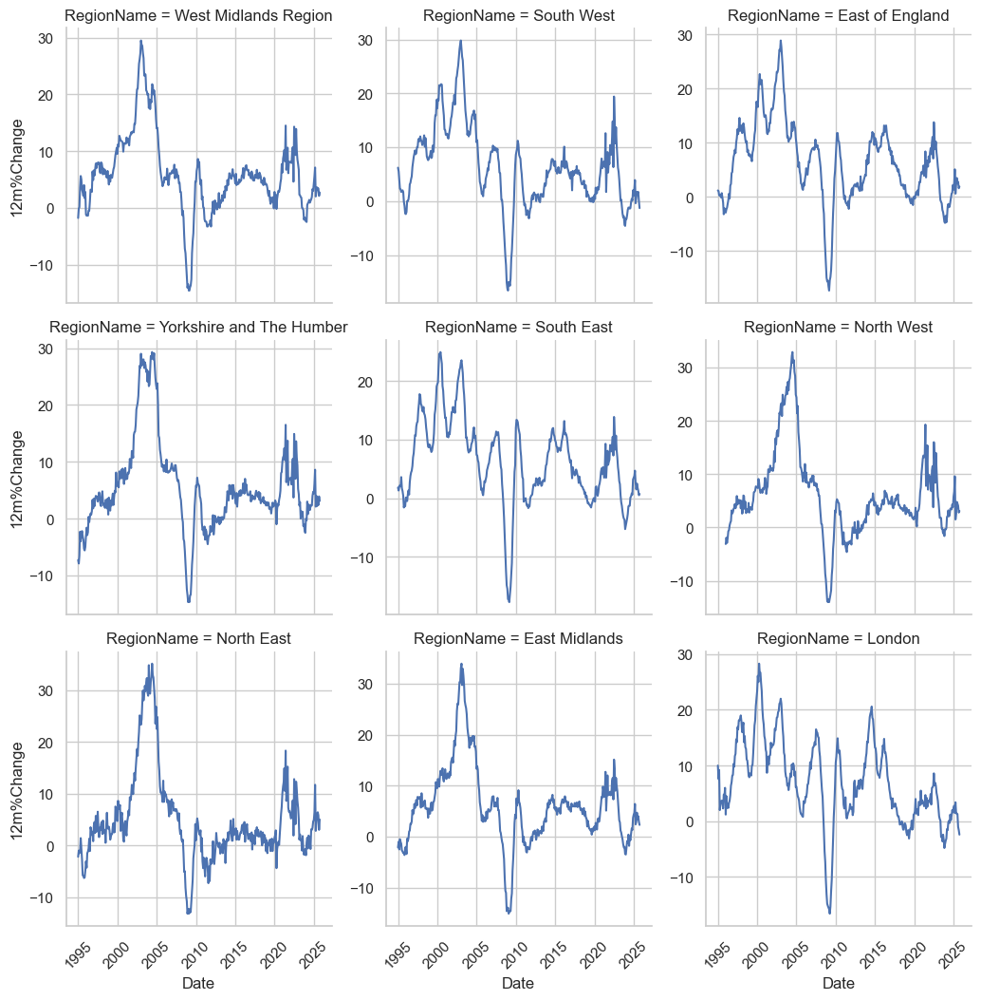

In [70]:

df_1995 = df_full[df_full['Date'] >= '1995-01-01']

g = sns.relplot(
    data=df_1995,
    x="Date",
    y="12m%Change",
    col="RegionName",
    kind="line",
    col_wrap=3,
    height=3.5,
    facet_kws={'sharey': False}
)

for ax in g.axes.flatten():
    ax.xaxis.set_major_locator(mdates.YearLocator(5))   # tick every 5 years
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.setp(ax.get_xticklabels(), rotation=45)

plt.show()


C:\Users\omaru\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8209 (\N{NON-BREAKING HYPHEN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


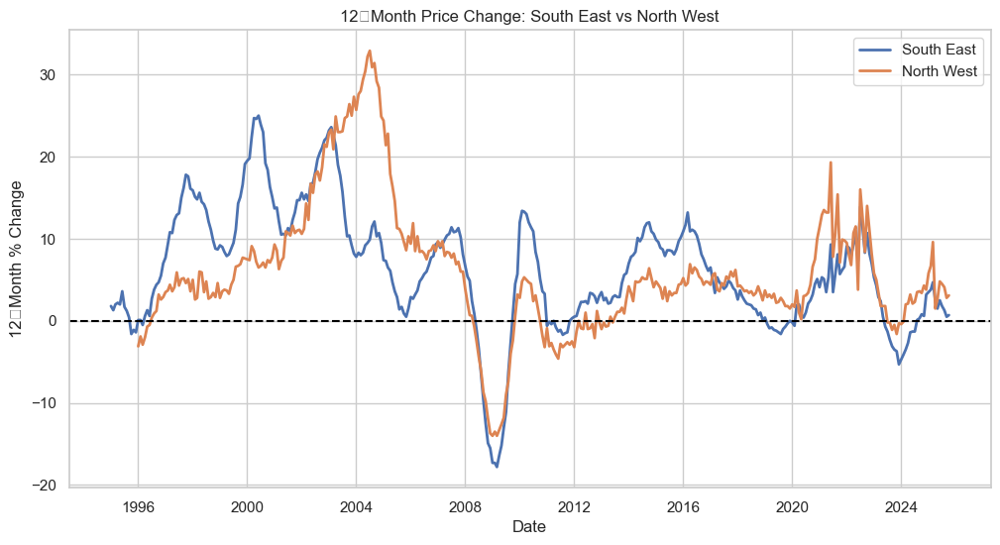

In [71]:
plt.figure(figsize=(12, 6))

for region in ["South East", "North West"]:
    subset = df_1995[df_1995['RegionName'] == region]
    plt.plot(subset['Date'], subset['12m%Change'], label=region, linewidth=2)

plt.axhline(0, color='black', linestyle='--')
plt.title("12‑Month Price Change: South East vs North West")
plt.xlabel("Date")
plt.ylabel("12‑Month % Change")
plt.legend()
plt.grid(True)
plt.show()


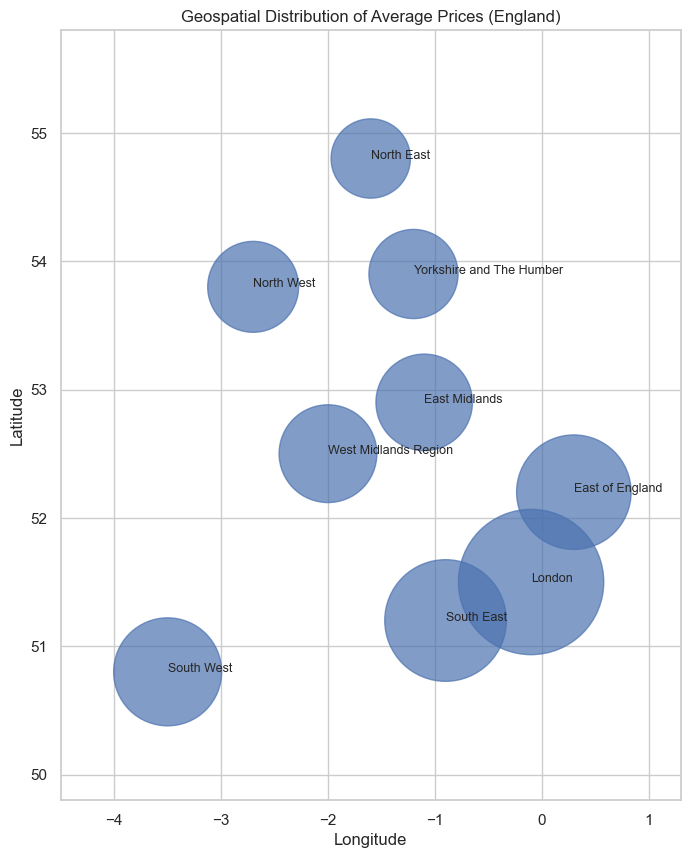

In [72]:
region_coords = {
    "North East": (54.8, -1.6),
    "North West": (53.8, -2.7),
    "Yorkshire and The Humber": (53.9, -1.2),
    "East Midlands": (52.9, -1.1),
    "West Midlands Region": (52.5, -2.0),
    "East of England": (52.2, 0.3),
    "London": (51.5, -0.1),
    "South East": (51.2, -0.9),
    "South West": (50.8, -3.5)
}


coords_df = pd.DataFrame([
    {"RegionName": r, "lat": region_coords[r][0], "lon": region_coords[r][1]}
    for r in region_coords
])

latest = df_full[df_full['Date'] == df_full['Date'].max()]
summary = latest.groupby("RegionName")['AveragePrice'].mean().reset_index()

merged = summary.merge(coords_df, on="RegionName")



plt.figure(figsize=(8, 10))
plt.scatter(merged['lon'], merged['lat'], s=merged['AveragePrice']/50, alpha=0.7)

for _, row in merged.iterrows():
    plt.text(row['lon'], row['lat'], row['RegionName'], fontsize=9)

plt.title("Geospatial Distribution of Average Prices (England)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xlim(merged['lon'].min() - 1.0, merged['lon'].max() + 1.0)
plt.ylim(merged['lat'].min() - 1.0, merged['lat'].max() + 1.0)
plt.show()


C:\Users\omaru\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1425: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


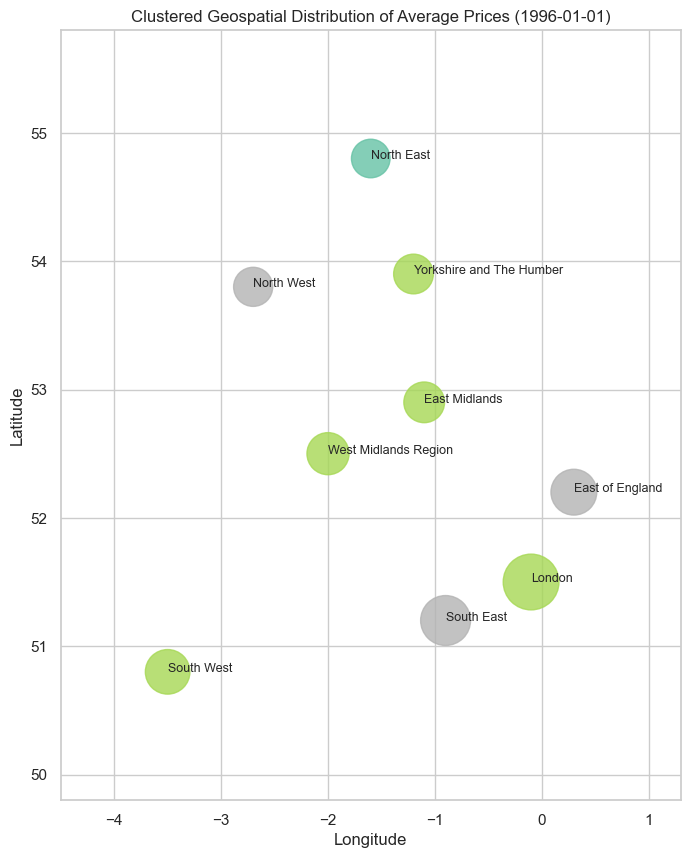

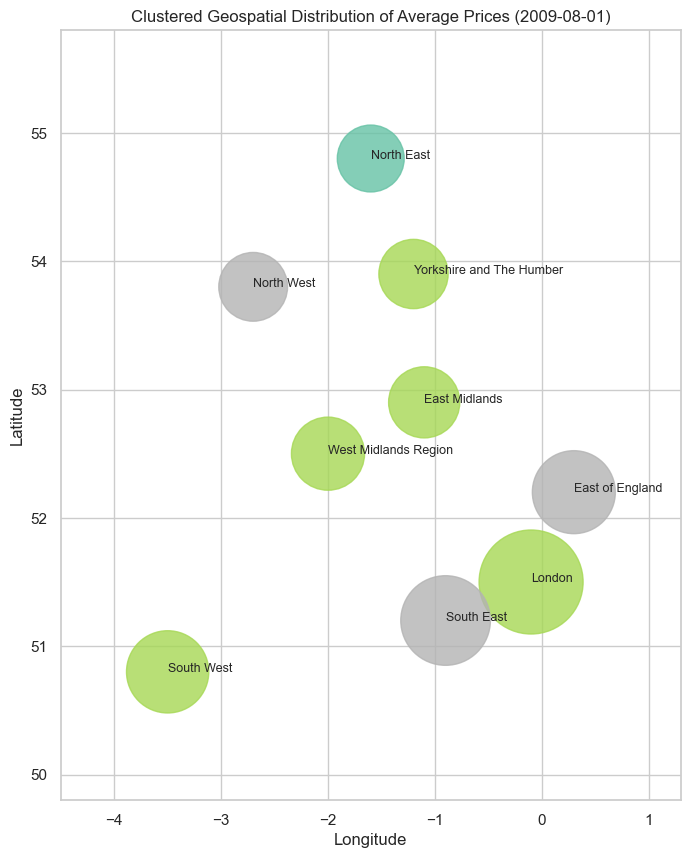

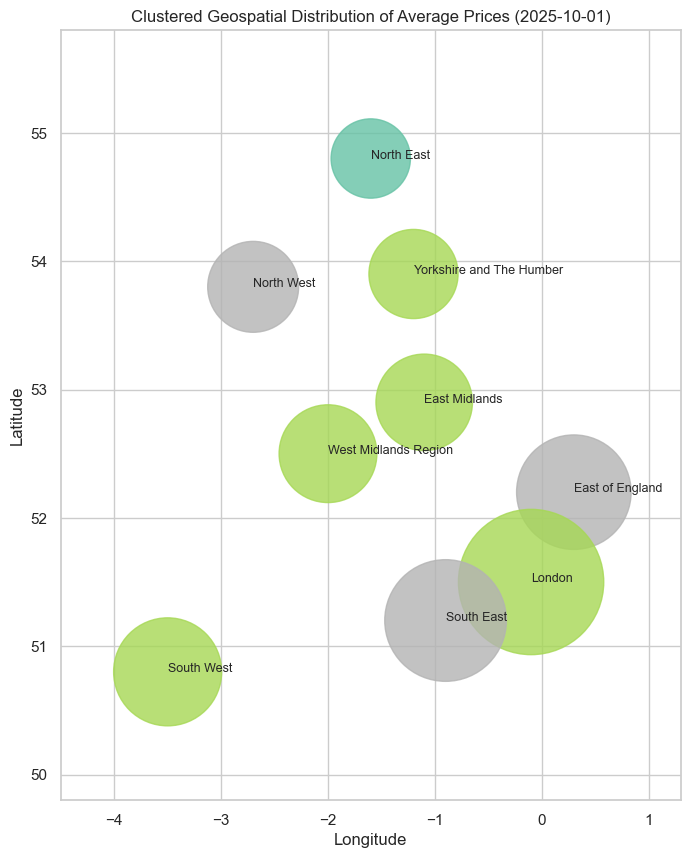

In [73]:

# -----------------------------
# 1. Region coordinates
# -----------------------------
region_coords = {
    "North East": (54.8, -1.6),
    "North West": (53.8, -2.7),
    "Yorkshire and The Humber": (53.9, -1.2),
    "East Midlands": (52.9, -1.1),
    "West Midlands Region": (52.5, -2.0),
    "East of England": (52.2, 0.3),
    "London": (51.5, -0.1),
    "South East": (51.2, -0.9),
    "South West": (50.8, -3.5)
}

coords_df = pd.DataFrame([
    {"RegionName": r, "lat": region_coords[r][0], "lon": region_coords[r][1]}
    for r in region_coords
])

# -----------------------------
# 2. Compute clusters ONCE (full dataset)
# -----------------------------
features = df_full.groupby("RegionName").agg({
    "AveragePrice": "mean",
    "1m%Change": "std",
    "12m%Change": "mean",
    "SalesVolume": "mean"
}).reset_index()

X = features[['AveragePrice', '1m%Change', '12m%Change', 'SalesVolume']]
X_scaled = StandardScaler().fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42)
features['Cluster'] = kmeans.fit_predict(X_scaled)

# -----------------------------
# 3. Function to plot clustered geospatial map for ANY date
# -----------------------------
def plot_clustered_geospatial(date):
    data = df_full[df_full['Date'] == date]
    summary = data.groupby("RegionName")['AveragePrice'].mean().reset_index()

    merged = summary.merge(coords_df, on="RegionName")
    merged = merged.merge(features[['RegionName','Cluster']], on="RegionName")

    plt.figure(figsize=(8, 10))
    plt.scatter(
        merged['lon'], merged['lat'],
        s=merged['AveragePrice']/50,
        c=merged['Cluster'],
        cmap='Set2',
        alpha=0.8
    )

    for _, row in merged.iterrows():
        plt.text(row['lon'], row['lat'], row['RegionName'], fontsize=9)

    plt.title(f"Clustered Geospatial Distribution of Average Prices ({date.date()})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Expand axes so bubbles are fully visible
    plt.xlim(merged['lon'].min() - 1.0, merged['lon'].max() + 1.0)
    plt.ylim(merged['lat'].min() - 1.0, merged['lat'].max() + 1.0)

    plt.show()

# -----------------------------
# 4. Generate the three maps
# -----------------------------
plot_clustered_geospatial(pd.Timestamp("1996-01-01"))
plot_clustered_geospatial(pd.Timestamp("2009-08-01"))
plot_clustered_geospatial(pd.Timestamp("2025-10-01"))


C:\Users\omaru\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1425: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


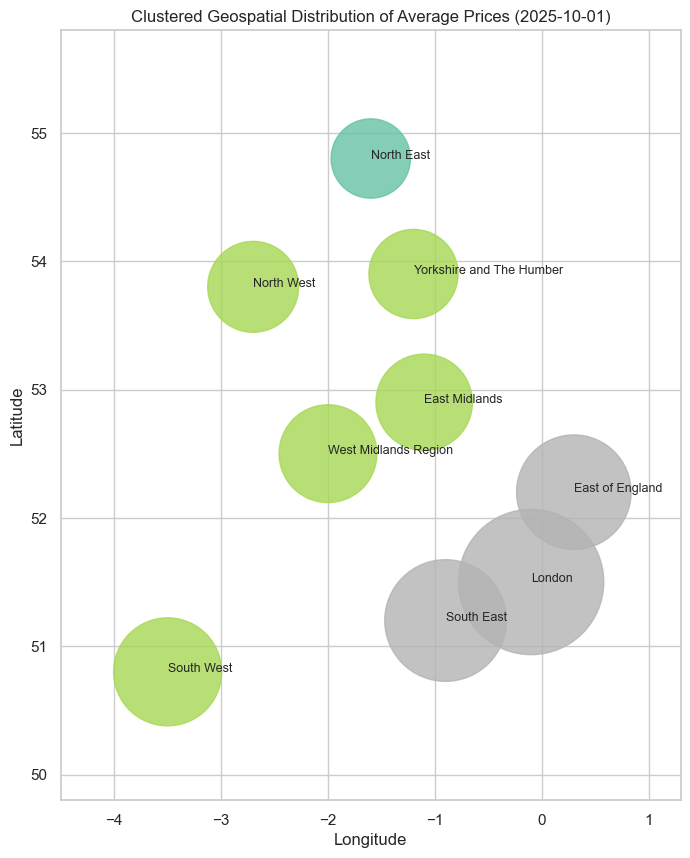

In [74]:
# -----------------------------
# 1. Region coordinates
# -----------------------------
region_coords = {
    "North East": (54.8, -1.6),
    "North West": (53.8, -2.7),
    "Yorkshire and The Humber": (53.9, -1.2),
    "East Midlands": (52.9, -1.1),
    "West Midlands Region": (52.5, -2.0),
    "East of England": (52.2, 0.3),
    "London": (51.5, -0.1),
    "South East": (51.2, -0.9),
    "South West": (50.8, -3.5)
}

coords_df = pd.DataFrame([
    {"RegionName": r, "lat": region_coords[r][0], "lon": region_coords[r][1]}
    for r in region_coords
])

# -----------------------------
# 2. Filter dataset to post-1995
# -----------------------------
df_1995 = df_full[df_full['Date'] >= '1995-01-01']

# -----------------------------
# 3. Compute behavioural features (post-1995 only)
# -----------------------------
features = df_1995.groupby("RegionName").agg({
    "AveragePrice": ["mean", "std"],
    "1m%Change": "std",
    "12m%Change": "mean",
    "SalesVolume": "mean"
}).reset_index()

# Flatten MultiIndex columns
features.columns = [
    "RegionName",
    "AveragePrice_mean",
    "AveragePrice_std",
    "1m%Change_std",
    "12m%Change_mean",
    "SalesVolume_mean"
]

# -----------------------------
# 4. Select features for clustering
# -----------------------------
X = features[['AveragePrice_mean',
              'AveragePrice_std',
              '1m%Change_std',
              '12m%Change_mean',
              'SalesVolume_mean']]

# -----------------------------
# 5. Scale + K-means clustering
# -----------------------------
X_scaled = StandardScaler().fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42)
features['Cluster'] = kmeans.fit_predict(X_scaled)

# -----------------------------
# 6. Function to plot clustered geospatial map for ANY date
# -----------------------------
def plot_clustered_geospatial(date):
    data = df_full[df_full['Date'] == date]
    summary = data.groupby("RegionName")['AveragePrice'].mean().reset_index()

    merged = summary.merge(coords_df, on="RegionName")
    merged = merged.merge(features[['RegionName','Cluster']], on="RegionName")

    plt.figure(figsize=(8, 10))
    plt.scatter(
        merged['lon'], merged['lat'],
        s=merged['AveragePrice']/50,
        c=merged['Cluster'],
        cmap='Set2',
        alpha=0.8
    )

    for _, row in merged.iterrows():
        plt.text(row['lon'], row['lat'], row['RegionName'], fontsize=9)

    plt.title(f"Clustered Geospatial Distribution of Average Prices ({date.date()})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    plt.xlim(merged['lon'].min() - 1.0, merged['lon'].max() + 1.0)
    plt.ylim(merged['lat'].min() - 1.0, merged['lat'].max() + 1.0)

    plt.show()

# -----------------------------
# 7. Generate the three maps
# -----------------------------
plot_clustered_geospatial(pd.Timestamp("2025-10-01"))


In [75]:
# -----------------------------
# Import Earnings Data
# -----------------------------

df_earn = pd.read_excel(r"C:\Users\omaru\Desktop\DSM050 CWK 2 Data\EARN05 Data.xlsx")
df_earn


,Unnamed: 0,United Kingdom,Great Britain,England,North East,North West,Yorkshire and The Humber,East Midlands,West Midlands,East of England,London,South East,South West,Wales,Scotland,Northern Ireland
0,Jan-Mar 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
1,Apr-Jun 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
2,Jul-Sep 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
3,Oct-Dec 1995,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
4,Jan-Mar 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
5,Apr-Jun 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
6,Jul-Sep 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
7,Oct-Dec 1996,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..
8,Jan-Mar 1997,329,330,335,307,301,296,305,307,348,390,369,331,295,307,264
9,Apr-Jun 1997,338,339,345,312,313,307,313,313,355,410,391,317,291,304,283


In [76]:
df_earn.columns.tolist()

['Unnamed: 0',
 'United Kingdom',
 'Great Britain',
 'England',
 'North East',
 'North West',
 'Yorkshire and The Humber',
 'East Midlands',
 'West Midlands',
 'East  of England',
 'London',
 'South East',
 'South West',
 'Wales',
 'Scotland',
 'Northern Ireland']

In [77]:
# Clean column names
df_earn.columns = (
    df_earn.columns
    .str.strip()
    .str.replace(r'\s+', ' ', regex=True)
)

# Rename first column
df_earn = df_earn.rename(columns={'Unnamed: 0': 'Period'})

# Select English regions
english_regions = [
    "North East", "North West", "Yorkshire and The Humber",
    "East Midlands", "West Midlands", "East of England",
    "London", "South East", "South West"
]

df_earn = df_earn[["Period"] + english_regions]

# Replace missing markers
df_earn = df_earn.replace(["..", "--"], pd.NA)
df_earn[english_regions] = df_earn[english_regions].apply(pd.to_numeric)

# CLEAN PERIOD COLUMN 
df_earn['Period'] = (
    df_earn['Period']
    .str.strip()
    .str.replace(r'\s+', ' ', regex=True)
)

# Extract correct year (fixes 20232, 20233, 20244)
df_earn['Year'] = df_earn['Period'].str.extract(r'(\d{4})').astype(int)

# Extract quarter
df_earn['Quarter'] = df_earn['Period'].str.extract(r'([A-Za-z]{3}-[A-Za-z]{3})')

# Rebuild clean Period string
df_earn['Period'] = df_earn['Quarter'] + " " + df_earn['Year'].astype(str)

# BACKFILL MISSING QUARTERS
missing_periods = ["Jan-Mar 2001", "Jul-Sep 2023"]

for period in missing_periods:
    idx = df_earn.index[df_earn['Period'] == period][0]
    prev_vals = df_earn.loc[idx - 1, english_regions]
    next_vals = df_earn.loc[idx + 1, english_regions]
    df_earn.loc[idx, english_regions] = (prev_vals + next_vals) / 2

# Expand quarters → months
quarter_months = {
    "Jan-Mar": ["01", "02", "03"],
    "Apr-Jun": ["04", "05", "06"],
    "Jul-Sep": ["07", "08", "09"],
    "Oct-Dec": ["10", "11", "12"]
}

rows = []

for _, row in df_earn.iterrows():
    year = row['Year']
    q = row['Quarter']
    for m in quarter_months[q]:
        new_row = row.copy()
        new_row['Date'] = pd.to_datetime(f"{year}-{m}-01")
        rows.append(new_row)

df_earn_monthly = pd.DataFrame(rows)

# Long format for merging
df_earn_long = df_earn_monthly.melt(
    id_vars=['Period', 'Year', 'Quarter', 'Date'],
    var_name='RegionName',
    value_name='WeeklyEarnings'
)

df_earn_long['RegionName'] = df_earn_long['RegionName'].str.strip()
#df_hpi['RegionName'] = df_hpi['RegionName'].str.strip()



In [78]:
df_earn_long = df_earn_long.dropna(subset=['WeeklyEarnings'])

df_earn_long['AnnualEarnings'] = df_earn_long['WeeklyEarnings'] * 52

df_earn_long

,Period,Year,Quarter,Date,RegionName,WeeklyEarnings,AnnualEarnings
24,Jan-Mar 1997,1997,Jan-Mar,1997-01-01,North East,307.000000,15964.000000
25,Jan-Mar 1997,1997,Jan-Mar,1997-02-01,North East,307.000000,15964.000000
26,Jan-Mar 1997,1997,Jan-Mar,1997-03-01,North East,307.000000,15964.000000
27,Apr-Jun 1997,1997,Apr-Jun,1997-04-01,North East,312.000000,16224.000000
28,Apr-Jun 1997,1997,Apr-Jun,1997-05-01,North East,312.000000,16224.000000
29,Apr-Jun 1997,1997,Apr-Jun,1997-06-01,North East,312.000000,16224.000000
30,Jul-Sep 1997,1997,Jul-Sep,1997-07-01,North East,292.000000,15184.000000
31,Jul-Sep 1997,1997,Jul-Sep,1997-08-01,North East,292.000000,15184.000000
32,Jul-Sep 1997,1997,Jul-Sep,1997-09-01,North East,292.000000,15184.000000
33,Oct-Dec 1997,1997,Oct-Dec,1997-10-01,North East,304.000000,15808.000000


In [79]:
# Ensure HPI Date is datetime
df_hpi['Date'] = pd.to_datetime(df_hpi['Date'])

# Merge monthly earnings with HPI
df_merge = df_hpi.merge(
    df_earn_long,
    on=['RegionName', 'Date'],
    how='left'
)

# Keep only rows from 1997 onwards (first valid earnings year)
df_merge = df_merge[df_merge['Date'] >= '1997-01-01']

# Drop rows where earnings are missing
df_merge = df_merge.dropna(subset=['WeeklyEarnings'])

# Add annual earnings
df_merge['AnnualEarnings'] = df_merge['WeeklyEarnings'] * 52

# Add affordability ratio
df_merge['Affordability'] = df_merge['AveragePrice'] / df_merge['AnnualEarnings']



In [80]:
df_merge

,Date,RegionName,AreaCode,AveragePrice,Index,IndexSA,1m%Change,12m%Change,AveragePriceSA,SalesVolume,DetachedPrice,DetachedIndex,Detached1m%Change,Detached12m%Change,SemiDetachedPrice,SemiDetachedIndex,SemiDetached1m%Change,SemiDetached12m%Change,TerracedPrice,TerracedIndex,Terraced1m%Change,Terraced12m%Change,FlatPrice,FlatIndex,Flat1m%Change,Flat12m%Change,CashPrice,CashIndex,Cash1m%Change,Cash12m%Change,CashSalesVolume,MortgagePrice,MortgageIndex,Mortgage1m%Change,Mortgage12m%Change,MortgageSalesVolume,FTBPrice,FTBIndex,FTB1m%Change,FTB12m%Change,FOOPrice,FOOIndex,FOO1m%Change,FOO12m%Change,NewPrice,NewIndex,New1m%Change,New12m%Change,NewSalesVolume,OldPrice,OldIndex,Old1m%Change,Old12m%Change,OldSalesVolume,Period,Year,Quarter,WeeklyEarnings,AnnualEarnings,Affordability
40139,1997-01-01,East Midlands,E12000004,45041,19.1,19.4,-1.8,4.8,45534.0,5315.0,70332.0,20.0,-1.4,5.2,41458.0,18.7,-2.5,4.1,32337.0,18.1,-1.5,5.5,28455.0,22.3,-1.8,3.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61465.0,18.7,-1.9,2.3,636.0,44085.0,19.0,-1.8,5.2,4679.0,Jan-Mar 1997,1997.0,Jan-Mar,305.000000,15860.000000,2.839912
40151,1998-01-01,East Midlands,E12000004,48889,20.8,21.0,0.9,8.5,49367.0,4941.0,77677.0,22.1,1.9,10.4,44725.0,20.2,-0.1,7.9,34683.0,19.4,0.7,7.3,29889.0,23.4,-0.3,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68165.0,20.7,2.4,10.9,542.0,47690.0,20.6,0.6,8.2,4399.0,Jan-Mar 1998,1998.0,Jan-Mar,313.000000,16276.000000,3.003748
40163,1999-01-01,East Midlands,E12000004,51095,21.7,21.9,-0.1,4.5,51533.0,4928.0,81189.0,23.1,0.5,4.5,46965.0,21.2,-0.3,5.0,35990.0,20.1,-0.4,3.8,31441.0,24.7,-1.7,5.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72258.0,22.0,0.6,6.0,525.0,49735.0,21.5,-0.2,4.3,4403.0,Jan-Mar 1999,1999.0,Jan-Mar,324.000000,16848.000000,3.032704
40175,2000-01-01,East Midlands,E12000004,55927,23.8,23.9,-0.5,9.5,56345.0,5721.0,89529.0,25.5,0.9,10.3,51024.0,23.0,-0.7,8.6,39359.0,22.0,-1.8,9.4,34520.0,27.1,-3.3,9.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,77720.0,23.6,-0.9,7.6,639.0,54584.0,23.6,-0.4,9.7,5082.0,Jan-Mar 2000,2000.0,Jan-Mar,340.000000,17680.000000,3.163292
40187,2001-01-01,East Midlands,E12000004,63289,26.9,27.1,0.7,13.2,63718.0,5592.0,101744.0,28.9,1.5,13.6,57669.0,26.0,0.2,13.0,44279.0,24.7,0.8,12.5,39785.0,31.2,-1.9,15.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91025.0,27.7,3.3,17.1,559.0,61464.0,26.6,0.4,12.6,5033.0,Jan-Mar 2001,2001.0,Jan-Mar,369.000000,19188.000000,3.298364
40199,2002-01-01,East Midlands,E12000004,72490,30.8,31.0,-0.1,14.5,72953.0,6356.0,116297.0,33.1,1.1,14.3,66145.0,29.8,-0.2,14.7,50558.0,28.3,-0.9,14.2,46809.0,36.7,-4.2,17.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103997.0,31.6,0.4,14.3,504.0,70421.0,30.4,-0.2,14.6,5852.0,Jan-Mar 2002,2002.0,Jan-Mar,370.395152,19260.547904,3.763652
40211,2003-01-01,East Midlands,E12000004,96421,41.0,41.2,2.0,33.0,97063.0,6889.0,151659.0,43.1,2.9,30.4,88023.0,39.7,0.9,33.1,68481.0,38.3,2.3,35.5,64250.0,50.4,0.9,37.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,131074.0,39.8,1.4,26.0,559.0,94298.0,40.7,2.1,33.9,6330.0,Jan-Mar 2003,2003.0,Jan-Mar,380.547417,19788.465688,4.872586
40223,2004-01-01,East Midlands,E12000004,114984,48.9,49.2,1.2,19.3,115798.0,7314.0,176812.0,50.3,2.1,16.6,106167.0,47.9,0.9,20.6,83005.0,46.4,0.6,21.2,75085.0,58.9,-0.2,16.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,156736.0,47.6,2.6,19.6,661.0,112415.0,48.6,1.0,19.2,6653.0,Jan-Mar 2004,2004.0,Jan-Mar,396.425333,20614.117294,5.577925
40235,2005-01-01,East Midlands,E12000004,130266,55.4,55.8,-1.8,13.3,131343.0,4327.0,194439.0,55.3,-1.4,10.0,120230.0,54.2,-2.0,13.2,96638.0,54.0,-2.1,16.4,86923.0,68.2,-1.7,15.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,179801.0,54.6,-0.5,14.7,584.0,127140.0,54.9,-2.0,13.1,3743.0,Jan-Mar 2005,2005.0

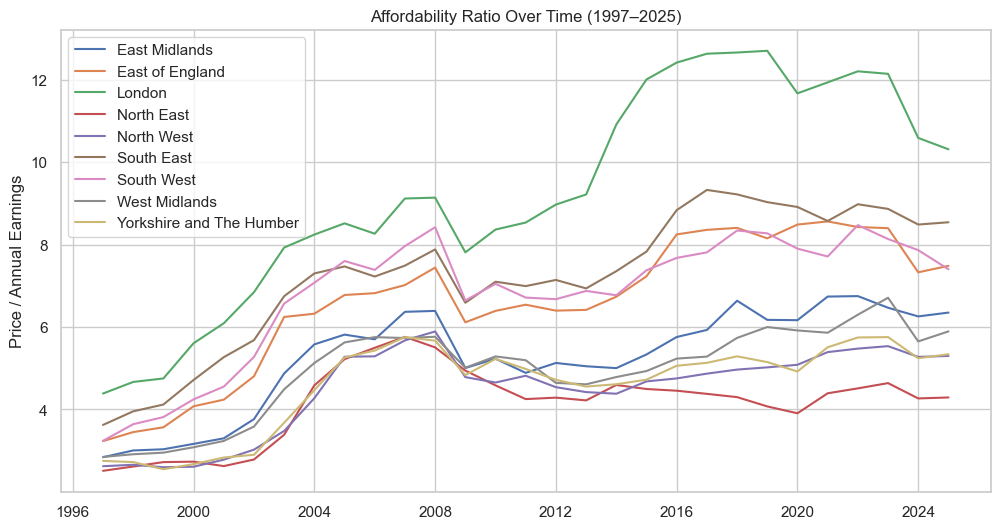

In [81]:
plt.figure(figsize=(12,6))
for region in df_merge['RegionName'].unique():
    subset = df_merge[df_merge['RegionName'] == region]
    plt.plot(subset['Date'], subset['Affordability'], label=region)

plt.title("Affordability Ratio Over Time (1997–2025)")
plt.ylabel("Price / Annual Earnings")
plt.legend()
plt.show()


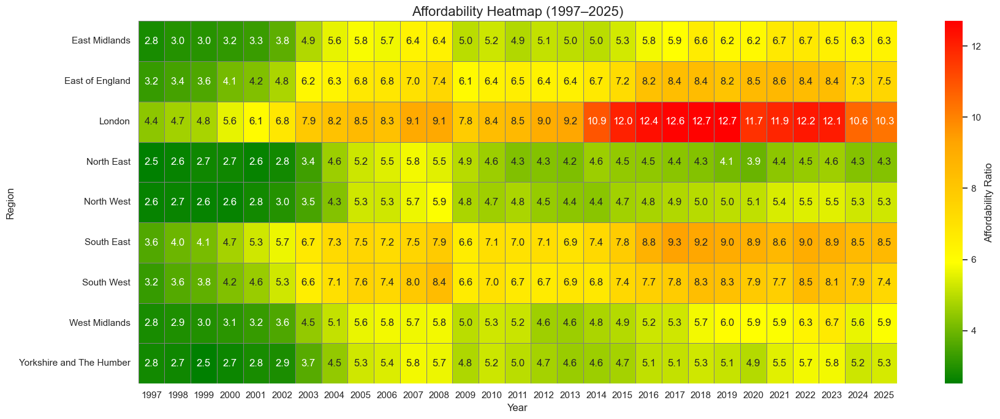

In [82]:

# Build the affordability pivot table
df_heat = df_merge.copy()
df_heat['Year'] = df_heat['Date'].dt.year

pivot = df_heat.pivot_table(
    index='RegionName',
    columns='Year',
    values='Affordability',
    aggfunc='mean'
)

# Custom green → yellow → orange → red colormap
colors = ["green", "yellow", "orange", "red"]
cmap = LinearSegmentedColormap.from_list("affordability_cmap", colors)

plt.figure(figsize=(18,7))
sns.heatmap(
    pivot,
    cmap=cmap,
    linewidths=0.4,
    linecolor='grey',
    annot=True,              # show numbers
    fmt=".1f",               # 1 decimal place
    cbar_kws={'label': 'Affordability Ratio'}
)

plt.title("Affordability Heatmap (1997–2025)", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

